# Import Statements


In [32]:
import pandas as pd
import numpy as np
import os
import random
import shutil

from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from matplotlib.image import imread
from IPython.display import display, Image as IPImage
import tensorflow as tf

import matplotlib as plt

from matplotlib.pyplot import imread

import matplotlib.pyplot as plt
%matplotlib inline

from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img

import matplotlib.pyplot as plt

from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import image_dataset_from_directory


In [33]:
current_directory = os.getcwd()
parent_directory = os.path.abspath(os.path.join(current_directory, os.pardir))
path_images = os.path.join(parent_directory, "raw_data/computer_vision/types/")
path_csv = os.path.join(parent_directory, "raw_data/computer_vision/pokemon.csv")
source_image = os.path.join(parent_directory, "raw_data/computer_vision/pokemon/")
df = pd.read_csv(path_csv)


In [34]:
df = df.fillna('')
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(sparse=False, drop='first'), ['Type1', 'Type2'])
    ],
    remainder='passthrough'
)
pipeline = Pipeline([
    ('preprocessor', preprocessor)
])

result = pipeline.fit_transform(df[['Type1', 'Type2']])
feature_names_out = pipeline.named_steps['preprocessor'].named_transformers_['onehot'].get_feature_names_out(['Type1', 'Type2'])
onehot_df = pd.DataFrame(result, columns=feature_names_out)
for col in onehot_df.columns:
    if col.startswith('Type1_'):
        onehot_df.rename(columns={col: col.replace('Type1_', '')}, inplace=True)
    elif col.startswith('Type2_'):
        onehot_df.rename(columns={col: col.replace('Type2_', '')}, inplace=True)
merged_df = onehot_df.groupby(level=0, axis=1).sum()
result = pd.concat([df, merged_df], axis=1)
result = result.drop(['Type1', 'Type2'], axis=1)


/home/groubix/.pyenv/versions/3.10.6/envs/catchemall/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [35]:
result


,Name,Bug,Dark,Dragon,Electric,Fairy,Fighting,Fire,Flying,Ghost,Grass,Ground,Ice,Normal,Poison,Psychic,Rock,Steel,Water
0,bulbasaur,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,ivysaur,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,venusaur,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,charmander,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,charmeleon,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,stakataka,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
805,blacephalon,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
806,zeraora,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
807,meltan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [36]:
result


,Name,Bug,Dark,Dragon,Electric,Fairy,Fighting,Fire,Flying,Ghost,Grass,Ground,Ice,Normal,Poison,Psychic,Rock,Steel,Water
0,bulbasaur,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,ivysaur,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,venusaur,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,charmander,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,charmeleon,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,stakataka,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
805,blacephalon,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
806,zeraora,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
807,meltan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [37]:
types_pokemon = result.columns
types_pokemon = types_pokemon.drop('Name')


In [38]:
types_pokemon


Index(['Bug', 'Dark', 'Dragon', 'Electric', 'Fairy', 'Fighting', 'Fire',
       'Flying', 'Ghost', 'Grass', 'Ground', 'Ice', 'Normal', 'Poison',
       'Psychic', 'Rock', 'Steel', 'Water'],
      dtype='object')

In [ ]:
def cleaning_identifier(folder):
    for filename in os.listdir(folder):
        if filename.endswith('.Identifier'):
            target_to_remove = os.path.join(folder, filename)
            os.remove(target_to_remove)

# cleaning_identifier(mettre dossier à clean)


In [ ]:
def auto_cleaning_identifier(folder):
    for filename in os.listdir(folder):
        tiny_folder = os.path.join(folder, filename)
        print(tiny_folder)
        if os.path.isdir(tiny_folder):
            for tiny_filename in os.listdir(tiny_folder):
                if tiny_filename.endswith('.Identifier'):
                    target_to_remove = os.path.join(tiny_folder, tiny_filename)
                    os.remove(target_to_remove)
        print(os.path.isdir(tiny_folder))
        if filename.endswith('.Identifier'):
            target_to_remove = os.path.join(folder, filename)
            os.remove(target_to_remove)

# auto_cleaning_identifier(mettre dossier types à clean)


In [ ]:
def copy_matching_pokemon_images(source_folder, target_folder):
    # check every type of pokemon
    for type_folder in os.listdir(target_folder):
        type_folder_path = os.path.join(target_folder, type_folder)

        # check file type in lower
        for target_name in os.listdir(type_folder_path):
            target_name_brut = target_name.lower()
            target_parts = target_name_brut.split('.')
            target_name = target_parts[0]

            # look every image on the new data source
            for filename in os.listdir(source_folder):
                source_file_path = os.path.join(source_folder, filename)
                # check source in lower

                source_filename_lower = filename.lower()
                # if the file start with de correct name

                if source_filename_lower.startswith(target_name):

                    # create the target
                    target_file_path = os.path.join(type_folder_path, filename)
                    # copy the image
                    shutil.copy(source_file_path, target_file_path)

source_folder = source_image
target_folder = path_images

#  copy_matching_pokemon_images(source_folder, target_folder)


In [39]:
pokemon_dict = {}
for type_pokemon in types_pokemon:
    path_images_type = f"{path_images}{type_pokemon}"
    pokemon_dict[type_pokemon] = ""
    temp_list = []
    for fichier in os.listdir(path_images_type):
        if fichier.endswith(('.png', '.jpg', 'jpeg')):
            temp_list.append(fichier)
            pokemon_dict[type_pokemon]=temp_list

pokemon_dict


{'Bug': ['Galvantula_32435.png',
  'Metapod_767.png',
  'Forretress_15229.png',
  'Wurmple_18941.png',
  'Dustox_19149.png',
  'Parasect_3508.png',
  'Weedle_945.png',
  'Venomoth_3715.png',
  'Masquerain_19908.png',
  'Burmy_26264.png',
  'Buzzwole_35929.png',
  'Mothim_26325.png',
  'Yanmega_28770.png',
  'Scizor_15674.png',
  'Mothim_26332.png',
  'Crustle_31420.png',
  'Shuckle_15762.png',
  'Yanma_14362.png',
  'Beautifly_19038.png',
  'Kricketune_25807.png',
  'Beedrill_1062.png',
  'Ariados_12719.png',
  'Golisopod_35643.png',
  'Dwebble_31395.png',
  'Weedle_907.png',
  'Karrablast_32222.png',
  'Butterfree_861.png',
  'Shelmet_32916.png',
  'Yanmega_28748.png',
  'Beedrill_1095.png',
  'Armaldo_23170.png',
  'Heracross_15796.png',
  'Butterfree_873.png',
  'Paras_3477.png',
  'Swadloon_30958.png',
  'Burmy_26266.png',
  'Larvesta_33471.png',
  'Wimpod_35632.png',
  'Escavalier_32240.png',
  'Anorith_23129.png',
  'Dewpider_35405.png',
  'Caterpie_688.png',
  'Beedrill_1090.png

In [40]:
nbr_poke = []
for key, values in pokemon_dict.items():
    taille = len(pokemon_dict[key])
    nbr_poke.append(taille)
nbr_poke


[3318,
 1831,
 1544,
 2170,
 1561,
 2068,
 2726,
 4557,
 1376,
 3903,
 3245,
 1620,
 5018,
 3572,
 3556,
 2738,
 1809,
 6523]

In [41]:
nbr_poke = {}
for key, values in pokemon_dict.items():
    nbr_poke[key] = len(pokemon_dict[key])

nbr_poke


{'Bug': 3318,
 'Dark': 1831,
 'Dragon': 1544,
 'Electric': 2170,
 'Fairy': 1561,
 'Fighting': 2068,
 'Fire': 2726,
 'Flying': 4557,
 'Ghost': 1376,
 'Grass': 3903,
 'Ground': 3245,
 'Ice': 1620,
 'Normal': 5018,
 'Poison': 3572,
 'Psychic': 3556,
 'Rock': 2738,
 'Steel': 1809,
 'Water': 6523}

In [42]:
my_picture_path_list = []
count = 0
for key, values in pokemon_dict.items():

    for i in values:
        chemin_image = f"{path_images}{key}/{i}"
        my_picture_path_list.append(chemin_image)
        count += 1

print(my_picture_path_list)


['/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Galvantula_32435.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Metapod_767.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Forretress_15229.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Wurmple_18941.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Dustox_19149.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Parasect_3508.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Weedle_945.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Venomoth_3715.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Masquerain_19908.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Burmy_26264.png', '/home/groubix/code/mtthibau

In [43]:
my_picture_path = {}
count = 0
for key, values in pokemon_dict.items():
    temp_list = []
    for i in values:
        chemin_image = f"{path_images}{key}/{i}"
        temp_list.append(chemin_image)
        my_picture_path[key] = temp_list
        count += 1

print(my_picture_path)


{'Bug': ['/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Galvantula_32435.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Metapod_767.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Forretress_15229.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Wurmple_18941.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Dustox_19149.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Parasect_3508.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Weedle_945.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Venomoth_3715.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Masquerain_19908.png', '/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/Bug/Burmy_26264.png', '/home/groubix/code/

In [44]:
message = 'python.png'

# check if the message starts with Python
print(message.endswith('.png'))


True


In [49]:
list_shape = []
for i in range(len(my_picture_path_list)):
    x = img_to_array(load_img(my_picture_path_list[i]))/255
    list_shape.append(x.shape)
set(list_shape)


/home/groubix/.pyenv/versions/3.10.6/envs/catchemall/lib/python3.10/site-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


{(50, 45, 3),
 (50, 56, 3),
 (60, 59, 3),
 (78, 47, 3),
 (60, 70, 3),
 (62, 36, 3),
 (53, 60, 3),
 (96, 96, 3),
 (120, 198, 3),
 (48, 70, 3),
 (31, 40, 3),
 (32, 48, 3),
 (74, 65, 3),
 (73, 74, 3),
 (90, 104, 3),
 (46, 54, 3),
 (75, 89, 3),
 (68, 73, 3),
 (97, 83, 3),
 (54, 46, 3),
 (47, 41, 3),
 (54, 57, 3),
 (64, 82, 3),
 (83, 89, 3),
 (49, 45, 3),
 (84, 97, 3),
 (33, 34, 3),
 (61, 47, 3),
 (62, 55, 3),
 (62, 66, 3),
 (51, 29, 3),
 (56, 35, 3),
 (80, 53, 3),
 (57, 54, 3),
 (57, 43, 3),
 (63, 79, 3),
 (73, 93, 3),
 (105, 82, 3),
 (41, 34, 3),
 (65, 63, 3),
 (70, 58, 3),
 (84, 70, 3),
 (80, 83, 3),
 (70, 69, 3),
 (53, 63, 3),
 (82, 87, 3),
 (72, 42, 3),
 (120, 168, 3),
 (42, 58, 3),
 (69, 102, 3),
 (32, 40, 3),
 (71, 79, 3),
 (54, 87, 3),
 (66, 67, 3),
 (83, 108, 3),
 (76, 92, 3),
 (67, 86, 3),
 (109, 103, 3),
 (61, 55, 3),
 (61, 66, 3),
 (61, 77, 3),
 (45, 55, 3),
 (58, 37, 3),
 (68, 49, 3),
 (56, 54, 3),
 (40, 54, 3),
 (116, 82, 3),
 (82, 49, 3),
 (120, 141, 3),
 (120, 130, 3),
 (69,

In [51]:
break


SyntaxError: 'break' outside loop (668683560.py, line 1)

In [50]:
nbr_test = {}
for key, value in nbr_poke.items():
    pourcentage = int(value*0.2)
    nbr_test[key] = pourcentage
nbr_test


{'Bug': 663,
 'Dark': 366,
 'Dragon': 308,
 'Electric': 434,
 'Fairy': 312,
 'Fighting': 413,
 'Fire': 545,
 'Flying': 911,
 'Ghost': 275,
 'Grass': 780,
 'Ground': 649,
 'Ice': 324,
 'Normal': 1003,
 'Poison': 714,
 'Psychic': 711,
 'Rock': 547,
 'Steel': 361,
 'Water': 1304}

In [ ]:
path_images


'/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/types/'

In [ ]:
pourcentage_train = 80

root_folder = os.path.join(parent_directory, "raw_data/computer_vision/")
destination_folder = os.path.join(root_folder, "train_test")
destination_train = os.path.join(destination_folder, "train")
destination_test = os.path.join(destination_folder, "test")

# clear the destination folder if exist
def clear_folder(folder):
    if os.path.exists(folder):
        shutil.rmtree(folder)
    os.makedirs(folder)

# apply the cleaning function
clear_folder(destination_folder)

for type_pokemon, fichiers in my_picture_path.items():
    # shuffle the path
    random.shuffle(fichiers)

    # take the pourcentage of train and round on integer
    split_index = int(len(fichiers) * pourcentage_train / 100)

    # manual slip for train/test
    train_set = fichiers[:split_index]
    test_set = fichiers[split_index:]

    # create train/test folder for every type
    train_folder = f"{type_pokemon}_train"
    test_folder = f"{type_pokemon}_test"
    os.makedirs(train_folder, exist_ok=True)
    os.makedirs(test_folder, exist_ok=True)

    # create a !!COPY!! for every pic on the right folder
    for fichier in train_set:
        shutil.copy(fichier, os.path.join(train_folder, os.path.basename(fichier)))

    for fichier in test_set:
        shutil.copy(fichier, os.path.join(test_folder, os.path.basename(fichier)))

    # move all folder on the right place
    shutil.move(train_folder, os.path.join(destination_train, train_folder))
    shutil.move(test_folder, os.path.join(destination_test, test_folder))


In [ ]:
train_data_dir = parent_directory + "/raw_data/computer_vision/train_test/train/"
test_data_dir = parent_directory + "/raw_data/computer_vision/train_test/test/"
print(train_data_dir)
print(test_data_dir)


/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/train_test/train/
/home/groubix/code/mtthibault/catchemall/raw_data/computer_vision/train_test/test/


In [ ]:
train_ds = image_dataset_from_directory(train_data_dir,
                                        labels="inferred",
                                        label_mode="categorical",
                                        image_size=(120,120),
                                        batch_size=32,
                                        seed=123)

train_ds


Found 1186 files belonging to 18 classes.


<BatchDataset element_spec=(TensorSpec(shape=(None, 120, 120, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 18), dtype=tf.float32, name=None))>

In [ ]:
shape = img_to_array(load_img(my_picture_path_list[i])).shape


In [ ]:

# Split dataset into Train, Validation & Test sets

size = 120   # Resize all images to (size,size)
bs = 32      # Batch size


# Data augmentation on train dataset only
train_data_gen = ImageDataGenerator(width_shift_range = 0.1,
                                    height_shift_range = 0.1,
                                    zoom_range=0.1,
                                    shear_range=0.1,
                                    brightness_range=[0.8,1.2],
                                    validation_split=0.15)
train_data = train_data_gen.flow_from_directory(destination_train,
                                                class_mode='categorical',
                                                target_size=(size,size),
                                                color_mode='rgb',
                                                batch_size=bs,
                                                seed=42,
                                                subset='training')

validation_data_gen = ImageDataGenerator(validation_split=0.15)

validation_data = validation_data_gen.flow_from_directory(destination_train,
                                                          class_mode='categorical',
                                                          target_size=(size,size),
                                                          color_mode='rgb',
                                                          batch_size=bs,
                                                          seed=42,
                                                          subset='validation')

test_data_gen = ImageDataGenerator(validation_split=0.10)

test_data = test_data_gen.flow_from_directory(destination_train,
                                              class_mode='categorical',
                                              target_size=(size,size),
                                              color_mode='rgb',
                                              subset='validation',
                                              shuffle=False)


Found 1016 images belonging to 18 classes.


Found 170 images belonging to 18 classes.
Found 111 images belonging to 18 classes.


In [ ]:
# Assign essential variables

shape = train_data.image_shape                 # Shape of train images (height,width,channels)
print(shape)
k = train_data.num_classes                     # Total number of labels or classes
train_samples = train_data.samples             # Total number of images in train set
validation_samples = validation_data.samples   # total number of images in validation set


(120, 120, 3)


In [ ]:
k


18

In [ ]:

# Build the model


input = Input(shape=shape)

basemodel = InceptionV3(include_top=False,
                        weights='imagenet',
                        input_shape=shape,
                        pooling='avg')
basemodel.trainable = False
x = basemodel(input)

x = Dense(18, activation='relu')(x)
x = Dropout(0.2)(x)
x = Dense(36, activation='relu')(x)
x = Dropout(0.2)(x)
x = Dense(36, activation='relu')(x)
x = Dropout(0.2)(x)
output = Dense(k, activation='softmax')(x)

model = Model(input,output)

# Compile the model

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# Initialize callbacks

stop = EarlyStopping(monitor='val_loss',
                     patience=4,
                     mode='min',
                     restore_best_weights=True)
checkpoint = ModelCheckpoint(filepath='{val_loss:.4f}-weights-{epoch:02d}.hdf5',
                             monitor='val_loss',
                             mode='min',
                             save_best_only=True)
# Model Summary

model.summary()


Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 120, 120, 3)]     0         
                                                                 
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 dense_18 (Dense)            (None, 18)                36882     
                                                                 
 dropout_12 (Dropout)        (None, 18)                0         
                                                                 
 dense_19 (Dense)            (None, 36)                684       
                                                                 
 dropout_13 (Dropout)        (None, 36)                0         
                                                                 
 dense_20 (Dense)            (None, 36)                1332

In [ ]:
# # Train the model

# ep = 50                      # Number of epochs
# spe = train_samples/bs       # Steps per epoch
# vs = validation_samples/bs   # Validation steps

# r = model.fit(train_data,
#               validation_data=validation_data,
#               steps_per_epoch=spe,
#               validation_steps=vs,
#               epochs=ep,
#               callbacks=[stop,checkpoint])


Epoch 1/50
31/31 [==============================] - 30s 731ms/step - loss: 5.8182 - accuracy: 0.1181 - val_loss: 2.8844 - val_accuracy: 0.1412
Epoch 2/50
31/31 [==============================] - 21s 649ms/step - loss: 2.8811 - accuracy: 0.1358 - val_loss: 2.8765 - val_accuracy: 0.1412
Epoch 3/50
31/31 [==============================] - 22s 686ms/step - loss: 2.8731 - accuracy: 0.1358 - val_loss: 2.8678 - val_accuracy: 0.1412
Epoch 4/50
31/31 [==============================] - 21s 657ms/step - loss: 2.8650 - accuracy: 0.1358 - val_loss: 2.8584 - val_accuracy: 0.1412
Epoch 5/50
31/31 [==============================] - 21s 649ms/step - loss: 2.8561 - accuracy: 0.1358 - val_loss: 2.8496 - val_accuracy: 0.1412
Epoch 6/50
22/31 [===================>..........] - ETA: 6s - loss: 2.8475 - accuracy: 0.1406

KeyboardInterrupt: 

In [ ]:
model.evaluate(validation_data)


5/5 [==============================] - 3s 507ms/step - loss: 2.8774 - accuracy: 0.0956


[2.877441883087158, 0.09558823704719543]

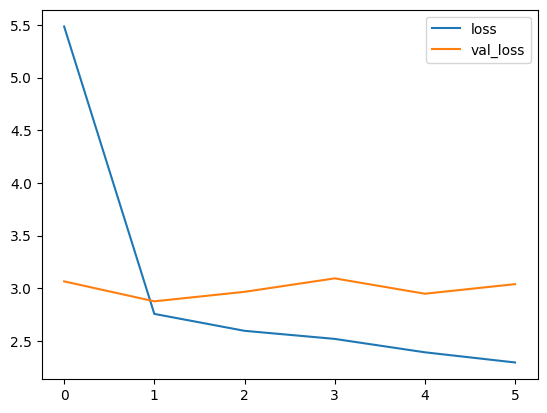

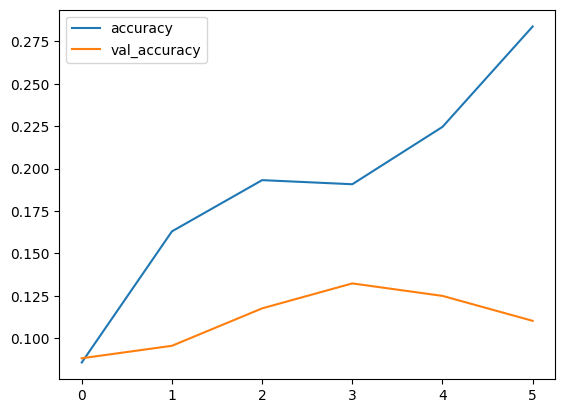

In [ ]:
# Plot training history

plt.plot(r.history['loss'], label='loss')
plt.plot(r.history['val_loss'], label='val_loss')
plt.legend()
plt.show()
plt.plot(r.history['accuracy'], label='accuracy')
plt.plot(r.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()
